In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import yaml
import time
import scipy
import gget

import torch
import anndata as an
import scanpy as sc
import rapids_singlecell as rsc
import scvi
import cuml

from scvi.external import CellAssign

sc.settings.verbosity = 3

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


# Load Data

In [2]:
%%time
fpath = "/scratch/indikar_root/indikar1/shared_data/bm_full/bm/bm.gene_raw_feature_bc_matrix/"

adata = sc.read_10x_mtx(fpath)
adata.obs['batch'] = 'bone_marrow'

print(f"Batch: bone_marrow")
print(f"\tTotal UMIs: {int(np.sum(adata.X))}")
print(f"\tCells: {adata.shape[0]}")
print(f"\tGenes: {adata.shape[1]}")

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
Batch: bone_marrow
	Total UMIs: 118662984
	Cells: 6269
	Genes: 26440
CPU times: user 5.85 s, sys: 936 ms, total: 6.78 s
Wall time: 5.56 s


# Filtering, processing

In [3]:
%%time
print("Saving full-dimension raw data...")
adata.raw = adata  # keep full dimension safe

print("Storing raw counts in .layers['raw_counts']...")
adata.layers['raw_counts'] = adata.X.copy()

print("Annotating mitochondrial, ribosomal, and hemoglobin genes...")
adata.var["mt"] = adata.var_names.str.startswith("MT-")
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

print("Moving AnnData to CPU for QC metric calculation...")
rsc.get.anndata_to_CPU(adata)

print("Calculating QC metrics (log1p transformed)...")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], 
    inplace=True, log1p=True
)

print("Transferring AnnData back to GPU...")
rsc.get.anndata_to_GPU(adata)

print("Filtering cells with fewer than 500 counts...")
rsc.pp.filter_cells(adata, min_counts=500)

print("Filtering genes with fewer than 10 total counts...")
rsc.pp.filter_genes(adata, min_counts=10)

min_n_genes = 1000
print(f"Subsetting cells with more than {min_n_genes} genes detected...")
adata = adata[adata.obs['n_genes_by_counts'] > min_n_genes, :].copy()

print("Normalizing total counts to 1e4 per cell...")
rsc.pp.normalize_total(adata, target_sum=1e4)

print("Applying log1p transformation...")
rsc.pp.log1p(adata)

print("Computing highly variable genes...")
rsc.pp.highly_variable_genes(adata)

print("Storing log-normalized data in .layers['log_norm']...")
adata.layers['log_norm'] = adata.X.copy()

print("Preprocessing complete.")
adata

Saving full-dimension raw data...
Storing raw counts in .layers['raw_counts']...
Annotating mitochondrial, ribosomal, and hemoglobin genes...
Moving AnnData to CPU for QC metric calculation...
Calculating QC metrics (log1p transformed)...
Transferring AnnData back to GPU...
Filtering cells with fewer than 500 counts...
filtered out 18 cells that have less than 500 counts
Filtering genes with fewer than 10 total counts...
filtered out 3486 genes that are detected in less than 10 counts
Subsetting cells with more than 1000 genes detected...
Normalizing total counts to 1e4 per cell...
Applying log1p transformation...
Computing highly variable genes...
Storing log-normalized data in .layers['log_norm']...
Preprocessing complete.
CPU times: user 1.95 s, sys: 1.25 s, total: 3.2 s
Wall time: 2.92 s


AnnData object with n_obs × n_vars = 5608 × 22954
    obs: 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'raw_counts', 'log_norm'

# Embedding

computing PCA
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:15)

bm_cluster
B1    2225
B5    1546
B2     523
B7     505
B4     453
B3     304
B6      52



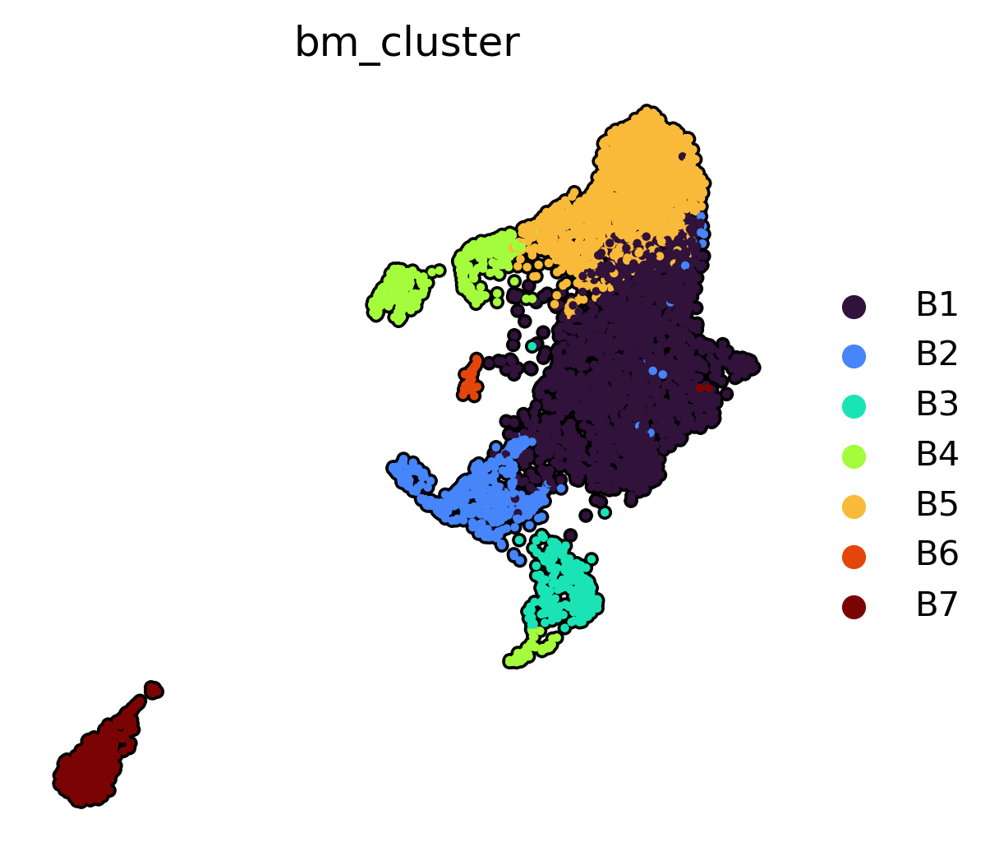

CPU times: user 24.6 s, sys: 616 ms, total: 25.2 s
Wall time: 24.7 s


In [4]:
%%time

# It's good practice to set the numpy random seed for global reproducibility
rng = 1729
np.random.seed(rng)

rsc.get.anndata_to_CPU(adata)

sc.pp.pca(adata, random_state=rng)
sc.pp.neighbors(adata, n_neighbors=45, random_state=rng)
sc.tl.umap(adata, min_dist=0.2, init_pos="random", random_state=rng)
rsc.tl.leiden(adata, resolution=0.38, random_state=rng)

adata.obs['bm_cluster'] = adata.obs['leiden'].apply(lambda x: f"B{int(x) + 1}")
adata.obs['bm_cluster'] = adata.obs['bm_cluster'].astype('str')

print()
print(adata.obs['bm_cluster'].value_counts().to_string())
print()

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color='bm_cluster',
    palette='turbo',
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.5,
)

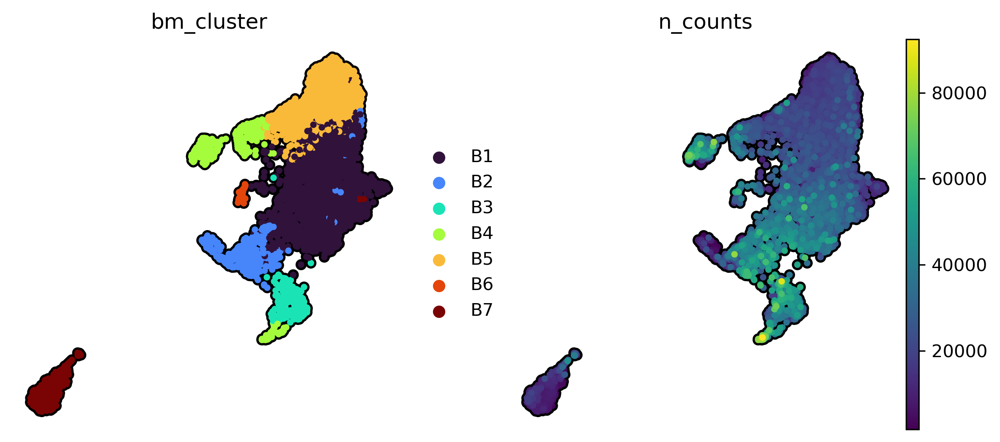

In [5]:
rsc.get.anndata_to_CPU(adata)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=['bm_cluster', 'n_counts'],
    size=55,
    ncols=3,
    sort_order=True,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.15,
)


adata.X.shape=(5608, 22954) type(adata.X)=<class 'numpy.ndarray'>


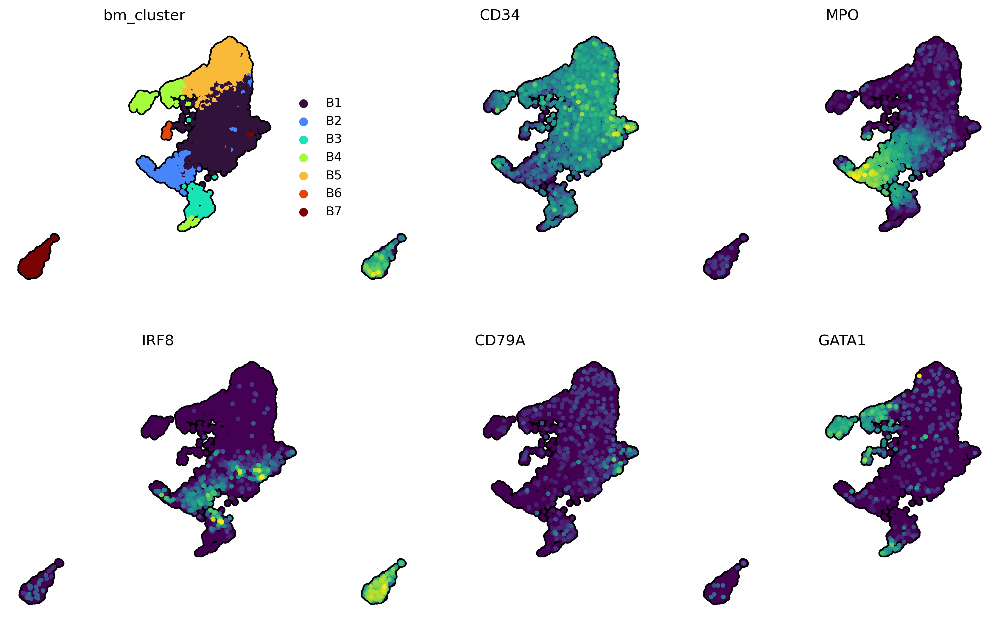

In [6]:
adata.X = adata.layers['log_norm'].copy().get().todense()
print(f"{adata.X.shape=} {type(adata.X)=}")
rsc.get.anndata_to_CPU(adata)

# setty genes
genes = ["bm_cluster", "CD34", "MPO", "IRF8", "CD79A", "GATA1"]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=genes,
    size=55,
    ncols=3,
    sort_order=True,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    colorbar_loc=None,
    frameon=False,
    wspace=0.15,
)


adata.X.shape=(5608, 22954) type(adata.X)=<class 'numpy.ndarray'>


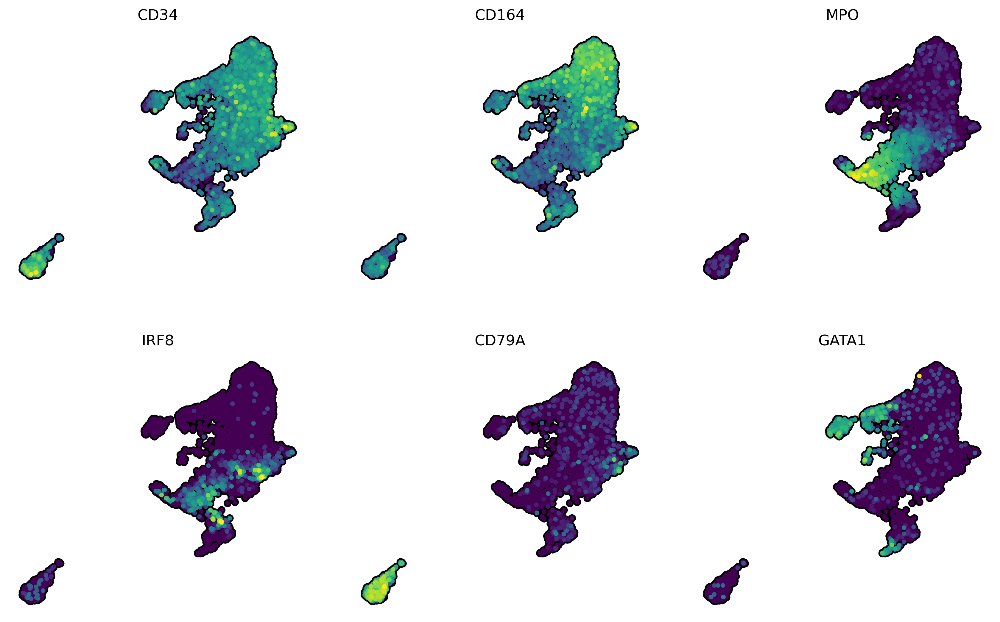

In [7]:
adata.X = adata.layers['log_norm'].copy().get().todense()
print(f"{adata.X.shape=} {type(adata.X)=}")
rsc.get.anndata_to_CPU(adata)

# setty genes
genes = ["CD34", 'CD164', "MPO", "IRF8", "CD79A", "GATA1"]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=genes,
    size=55,
    ncols=3,
    sort_order=True,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    colorbar_loc=None,
    frameon=False,
    wspace=0.15,
)


adata.X.shape=(5608, 22954) type(adata.X)=<class 'numpy.ndarray'>


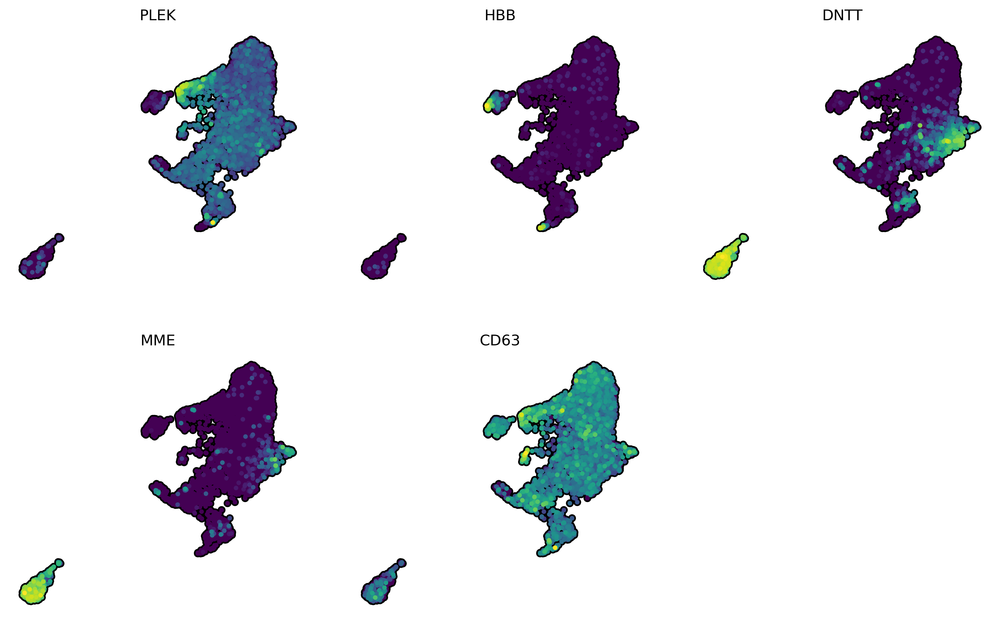

In [8]:
adata.X = adata.layers['log_norm'].copy().get().todense()
print(f"{adata.X.shape=} {type(adata.X)=}")
rsc.get.anndata_to_CPU(adata)

# setty genes
genes = ["PLEK", "HBB", "DNTT", "MME", "CD63"]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=genes,
    size=55,
    ncols=3,
    sort_order=True,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    colorbar_loc=None,
    frameon=False,
    wspace=0.15,
)


adata.X.shape=(5608, 22954) type(adata.X)=<class 'numpy.ndarray'>


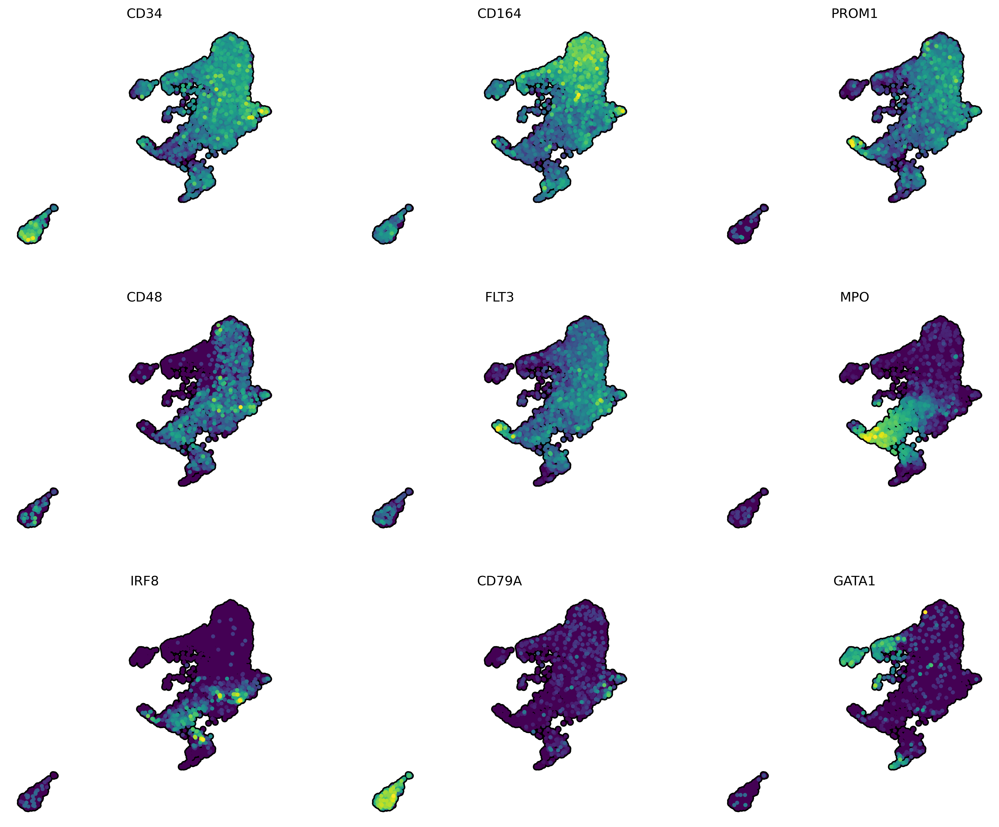

In [9]:
adata.X = adata.layers['log_norm'].copy().get().todense()
print(f"{adata.X.shape=} {type(adata.X)=}")
rsc.get.anndata_to_CPU(adata)

# setty genes
genes = [
    "CD34", "CD164", 
    "PROM1", "CD48",
    "FLT3", "MPO", 
    "IRF8", "CD79A", 
    "GATA1",
]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=genes,
    size=55,
    ncols=3,
    sort_order=True,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    colorbar_loc=None,
    frameon=False,
    wspace=0.3,
)


/tmp/ipykernel_3793551/3013193314.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = df.groupby('bm_cluster').mean()


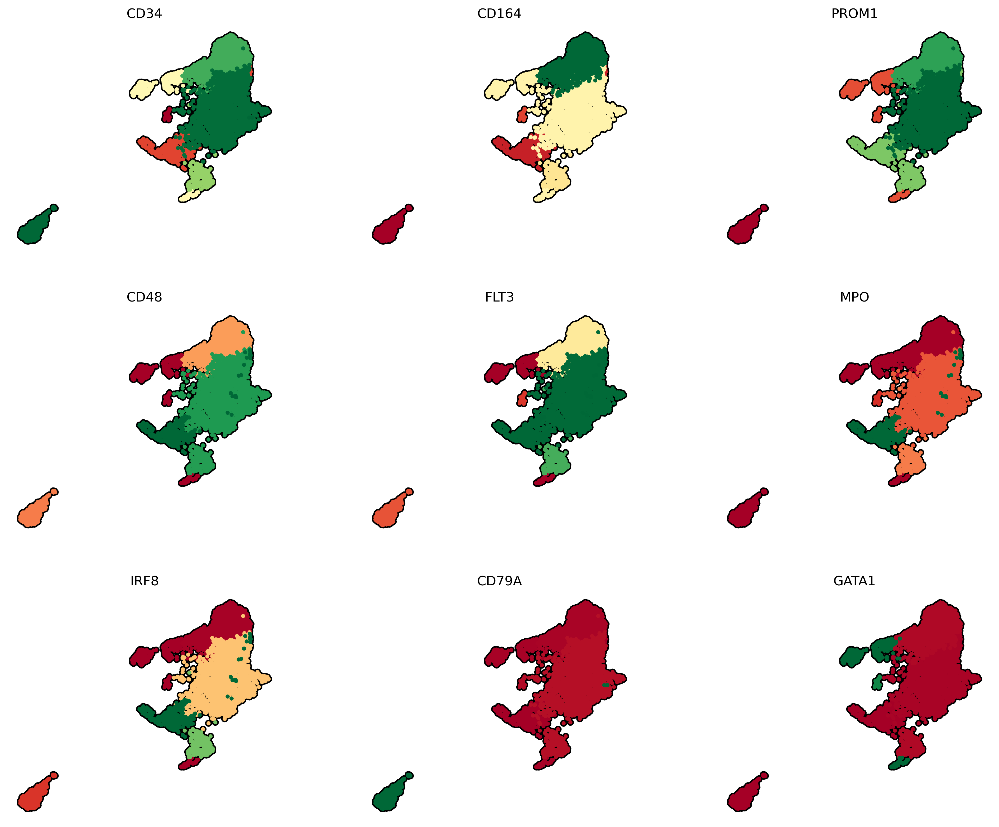

In [10]:
# Compute per-cluster mean expression and map to each cell
df = adata.to_df()[genes].copy()
df['bm_cluster'] = adata.obs['bm_cluster'].values
means = df.groupby('bm_cluster').mean()

# Assign average values back to obs
for gene in genes:
    adata.obs[f"{gene}_avg"] = adata.obs['bm_cluster'].map(means[gene]).astype(float)

# Plot UMAP using averaged values
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=[f"{g}_avg" for g in genes],
    size=55,
    ncols=3,
    sort_order=True,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title=[f"{g}" for g in genes],
    colorbar_loc=None,
    cmap='RdYlGn',
    frameon=False,
    wspace=0.3,
)

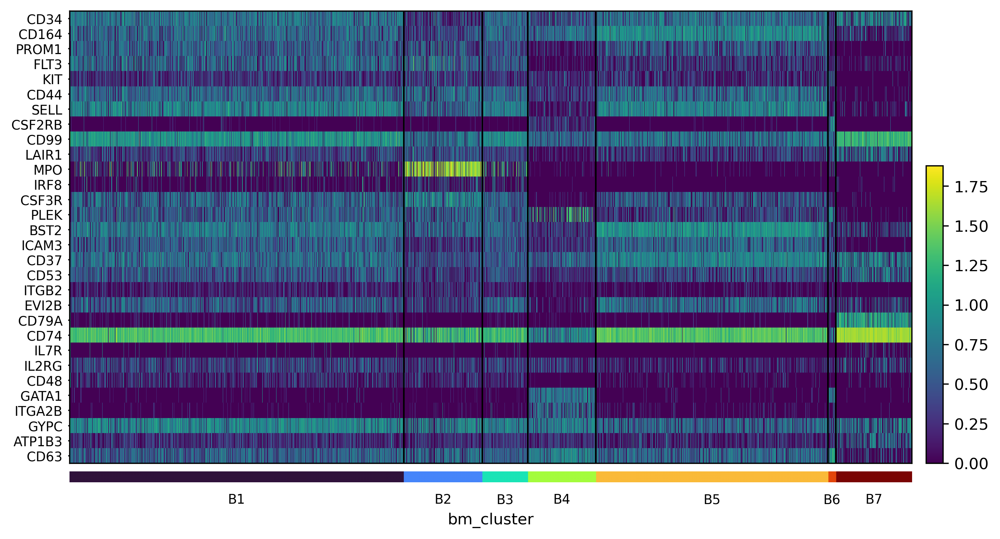

In [11]:
gene_list = [
    # HSC / HSPC markers
    "CD34", "CD164", "PROM1", "FLT3", "KIT", "CD44", "SELL",
    "CSF2RB", "CD99", "LAIR1",
    
    # Myeloid / granulocyte–monocyte markers
    "MPO", "IRF8", "CSF3R", "PLEK", "BST2", "ICAM3",
    "CD37", "CD53", "ITGB2", "EVI2B",
    
    # Lymphoid / B- & T-cell lineage markers
    "CD79A", "CD74", "IL7R", "IL2RG", "CD48",
    
    # Erythroid / megakaryocyte markers
    "GATA1", "ITGA2B", "GYPC", "ATP1B3", "CD63"
]

sc.pl.heatmap(
    adata, 
    gene_list, 
    groupby='bm_cluster',
    use_raw=False,
    swap_axes=True,
    log=True,
)

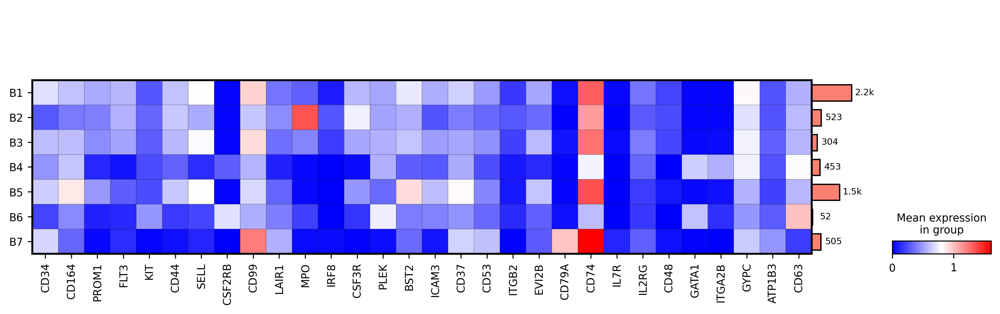

In [12]:
mp = sc.pl.matrixplot(
    adata,
    gene_list, 
    groupby='bm_cluster',
    cmap='bwr',
    use_raw=False, 
    return_fig=True,
    log=True,
)
mp.add_totals().style(edge_color='black').show()

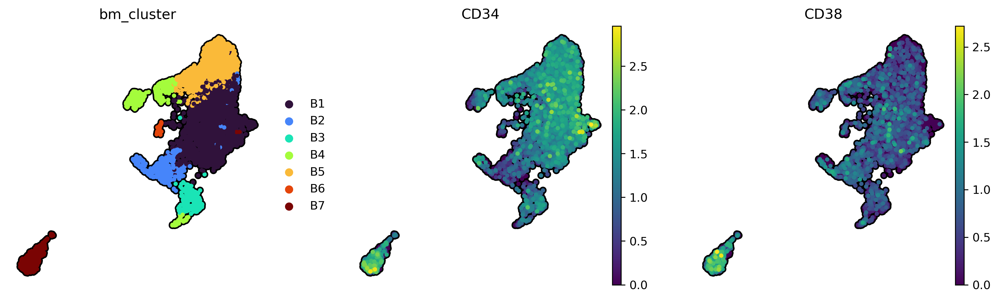

In [13]:
rsc.get.anndata_to_CPU(adata)

# selection genes
genes = ["bm_cluster", "CD34", "CD38"]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=genes,
    size=55,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
)

# HTO Tags

In [14]:
fpath = "/scratch/indikar_root/indikar1/shared_data/bone_marrow_tsb/feature_barcodes/fbc_map.csv"
df = pd.read_csv(fpath)
df['cell_barcode'] = df['cell_barcode'] + "-1"
df = df.drop(columns='pred')
df = pd.melt(df, id_vars='cell_barcode')
df["variable"] = df["variable"].str.replace(r"^chunk_\d+_", "", regex=True)
print(list(df['variable'].unique()))

# sum over all chunks
df = df.groupby(['cell_barcode', 'variable'])['value'].sum().reset_index()
df = pd.pivot_table(df, index='cell_barcode', columns='variable', values='value', fill_value=0.0)
print(f"raw {df.shape=}")
df = df.reindex(adata.obs_names) # sort like adata
print(f"filtered {df.shape=}")

# max predictions
pred_map = {
    'CD34pos_CD38neg_B0251_HTO_1' : r"CD34+/CD38- (HTO:1)",
    'CD34pos_CD38pos_B0252_HTO_2' : r"CD34+/CD38+ (HTO:2)",
}
df['HTO_pred'] = df.idxmax(axis=1)
df['HTO_pred_label'] = df['HTO_pred'].map(pred_map)

print(df['HTO_pred_label'].value_counts().to_string())

print(df.head().to_string())

['CD34pos_CD38neg_B0251_HTO_1', 'CD34pos_CD38pos_B0252_HTO_2']
raw df.shape=(6288, 2)
filtered df.shape=(5608, 2)
HTO_pred_label
CD34+/CD38- (HTO:1)    4992
CD34+/CD38+ (HTO:2)     605
variable            CD34pos_CD38neg_B0251_HTO_1  CD34pos_CD38pos_B0252_HTO_2                     HTO_pred       HTO_pred_label
AAACCAAAGGCGATCT-1                         30.0                          2.0  CD34pos_CD38neg_B0251_HTO_1  CD34+/CD38- (HTO:1)
AAACCAAAGGTGAACG-1                         23.0                          2.0  CD34pos_CD38neg_B0251_HTO_1  CD34+/CD38- (HTO:1)
AAACCATTCCCTGTCA-1                         28.0                          0.0  CD34pos_CD38neg_B0251_HTO_1  CD34+/CD38- (HTO:1)
AAACCATTCCGCGATG-1                         18.0                          1.0  CD34pos_CD38neg_B0251_HTO_1  CD34+/CD38- (HTO:1)
AAACCATTCCTGTCGC-1                         21.0                          1.0  CD34pos_CD38neg_B0251_HTO_1  CD34+/CD38- (HTO:1)


/tmp/ipykernel_3793551/3910916195.py:21: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  df['HTO_pred'] = df.idxmax(axis=1)


In [15]:
adata.obs = adata.obs.join(df)    
adata.obs.head()

,batch,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,...,CD48_avg,FLT3_avg,MPO_avg,IRF8_avg,CD79A_avg,GATA1_avg,CD34pos_CD38neg_B0251_HTO_1,CD34pos_CD38pos_B0252_HTO_2,HTO_pred,HTO_pred_label
AAACCAAAGGCGATCT-1,bone_marrow,7035,8.858795,44635.0,10.706296,34.950151,49.842052,57.302565,66.010978,1521.0,...,0.286691,0.874494,0.562107,0.138602,0.071016,0.023864,30.0,2.0,CD34pos_CD38neg_B0251_HTO_1,CD34+/CD38- (HTO:1)
AAACCAAAGGTGAACG-1,bone_marrow,4440,8.398635,21652.0,9.982900,37.091262,51.533346,59.763532,69.517827,639.0,...,0.006043,0.071663,0.038003,0.000816,0.027891,0.984393,23.0,2.0,CD34pos_CD38neg_B0251_HTO_1,CD34+/CD38- (HTO:1)
AAACCATTCCCTGTCA-1,bone_marrow,6370,8.759512,40379.0,10.606090,33.547141,47.425642,56.833998,66.601451,1230.0,...,0.284677,0.749542,0.774386,0.317316,0.070978,0.035873,28.0,0.0,CD34pos_CD38neg_B0251_HTO_1,CD34+/CD38- (HTO:1)
AAACCATTCCGCGATG-1,bone_marrow,3872,8.261785,15760.0,9.665294,37.912437,51.979695,59.904822,69.302030,545.0,...,0.092357,0.419530,0.041540,0.002669,0.028656,0.036131,18.0,1.0,CD34pos_CD38neg_B0251_HTO_1,CD34+/CD38- (HTO:1)
AAACCATTCCTGTCGC-1,bone_marrow,4817,8.480114,19367.0,9.871378,30.897919,43.754841,52.253834,62.621986,624.0,...,0.286691,0.874494,0.562107,0.138602,0.071016,0.023864,21.0,1.0,CD34pos_CD38neg_B0251_HTO_1,CD34+/CD38- (HTO:1)


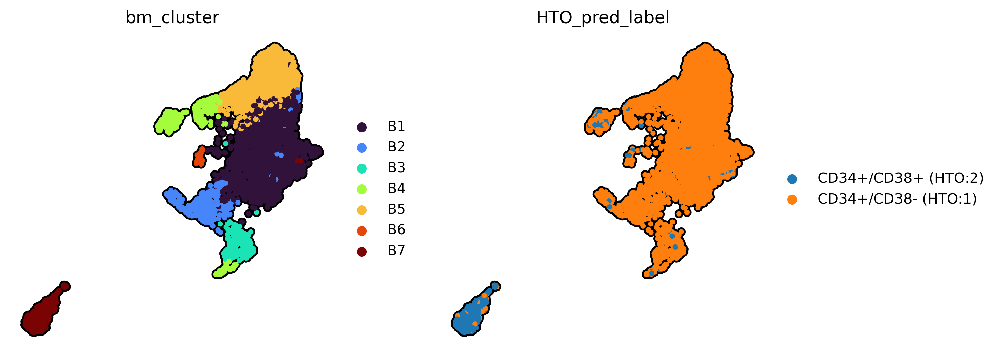

In [16]:
# selection variables
genes = ["bm_cluster", "HTO_pred_label"]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=genes,
    size=55,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    outline_color=('k', 'k'),
    frameon=False,
)

# Differential Expression Analysis

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


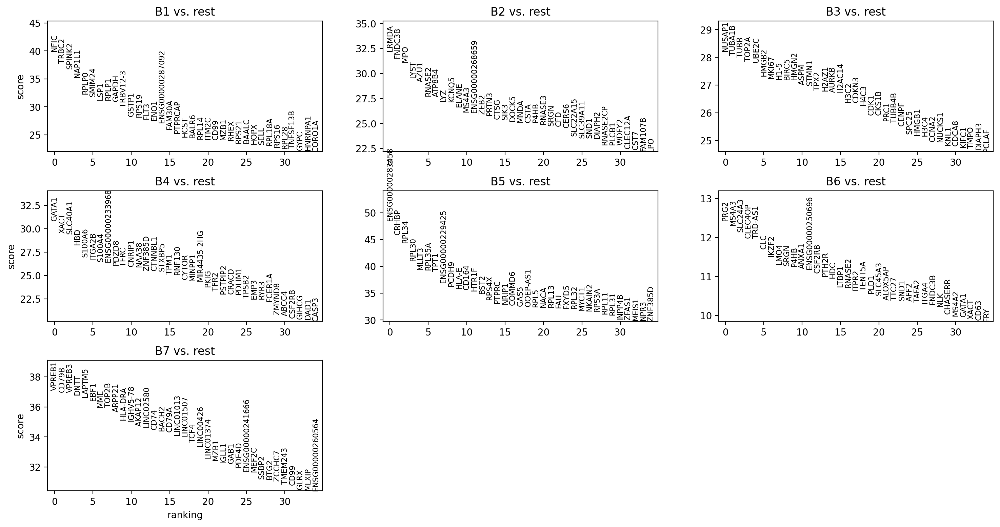

CPU times: user 12 s, sys: 4.98 s, total: 17 s
Wall time: 8.95 s


,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,B1,NFIC,39.949787,1.647004,0.000000e+00,0.000000e+00,0.954607,0.703518
1,B1,TRBC2,37.773407,2.610450,0.000000e+00,0.000000e+00,0.773483,0.231451
2,B1,SPINK2,36.745480,1.764758,1.372922e-295,1.050469e-291,0.993258,0.731599
3,B1,TRBV12-3,29.908192,2.387090,1.539809e-196,3.534478e-193,0.622472,0.173515
4,B1,LINC01819,21.655407,1.588645,5.405212e-104,3.101781e-101,0.586966,0.276086


In [17]:
%%time
rsc.get.anndata_to_CPU(adata)
sc.tl.rank_genes_groups(
    adata, 
    groupby='bm_cluster',
    method='wilcoxon',
    use_raw=False,
    pts=True,
)

deg = sc.get.rank_genes_groups_df(
    adata, 
    group=None,
    pval_cutoff=0.05,
    log2fc_min=1.5,
    log2fc_max=10.0,
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 3
sc.pl.rank_genes_groups(
    adata,
    n_genes=35,
    sharey=False,
    ncols=3,
    
)

deg.head()

pdf.shape=(1728, 8)


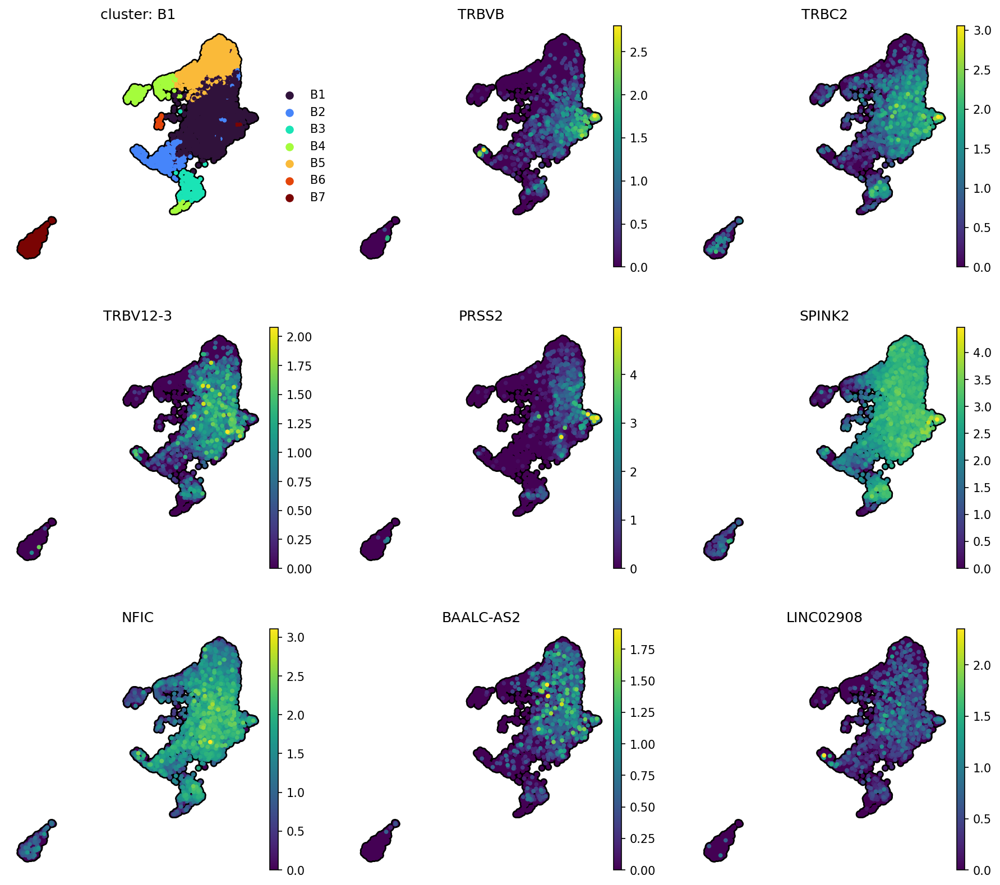

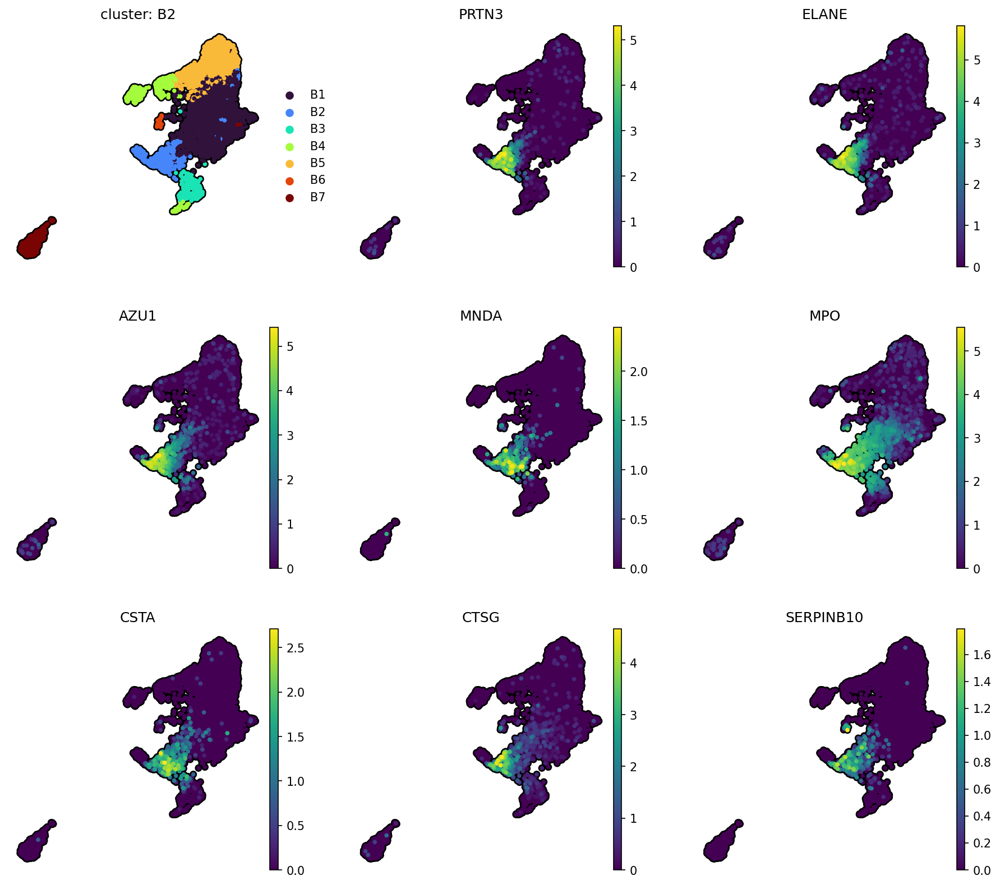

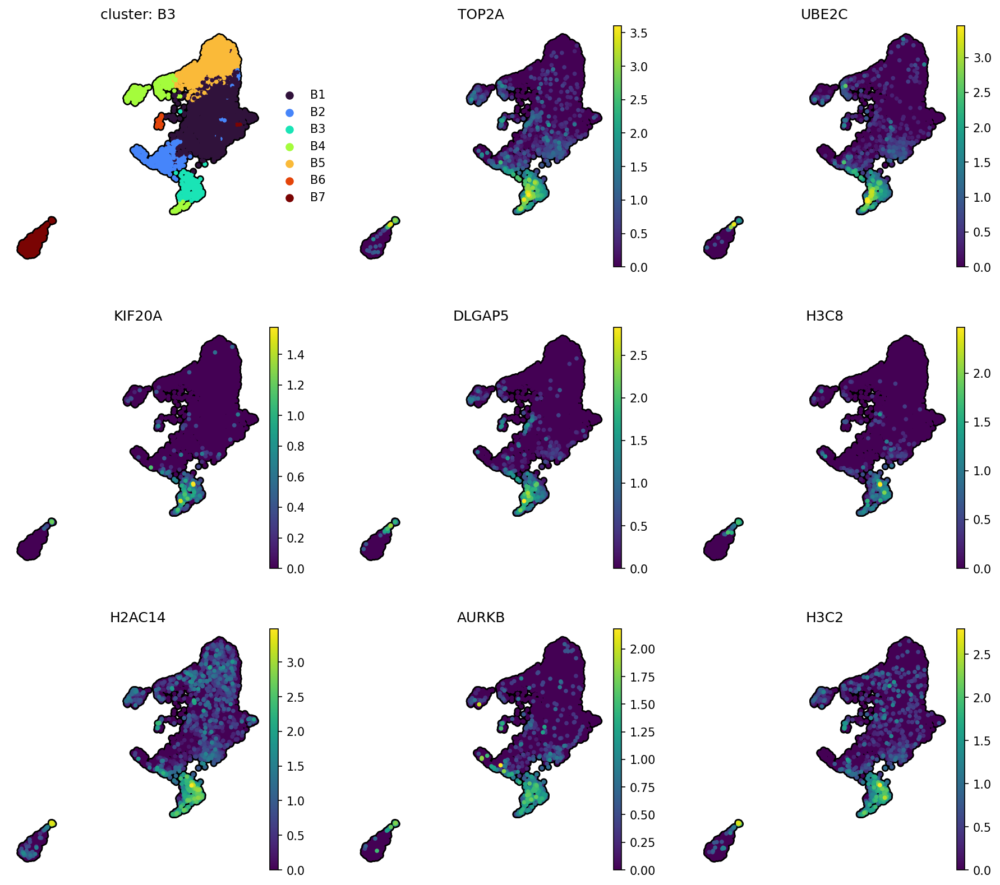

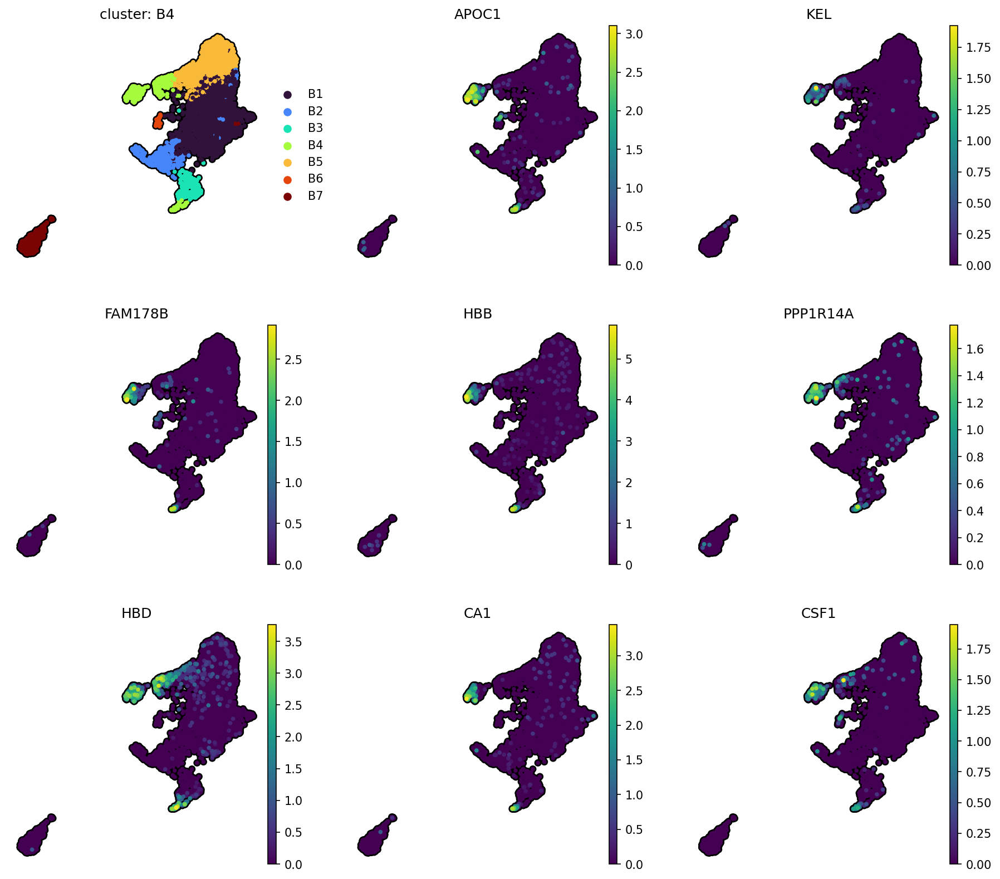

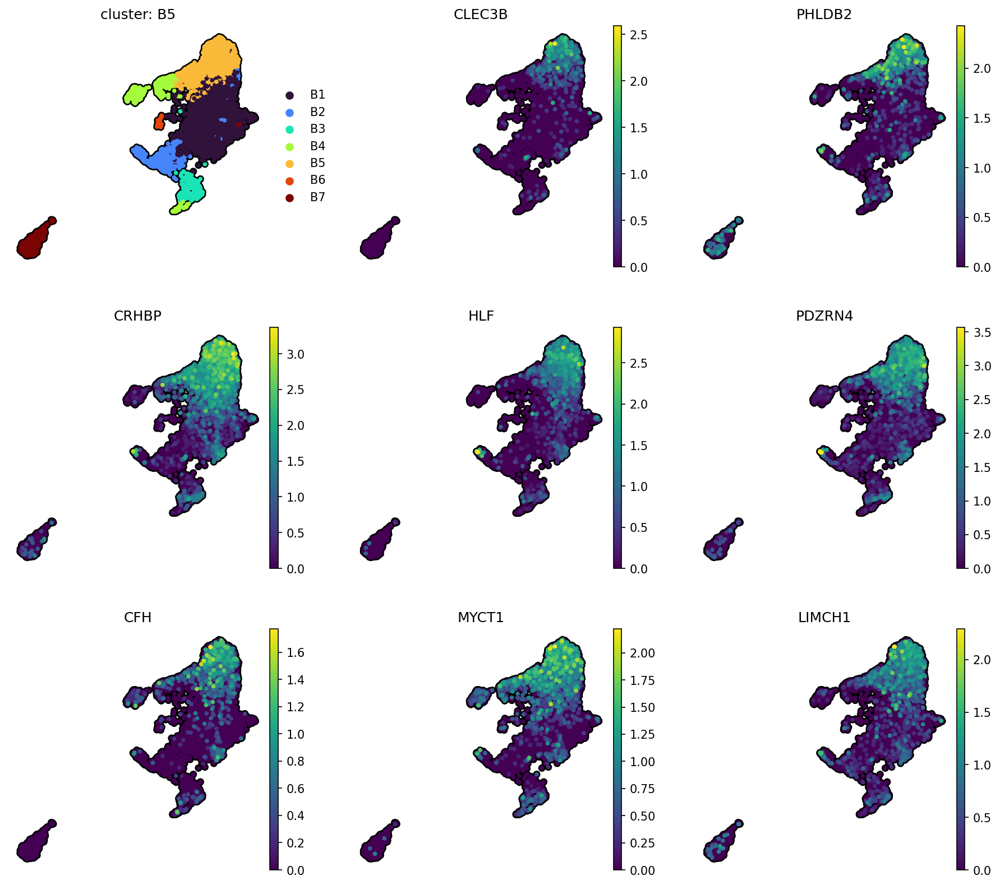

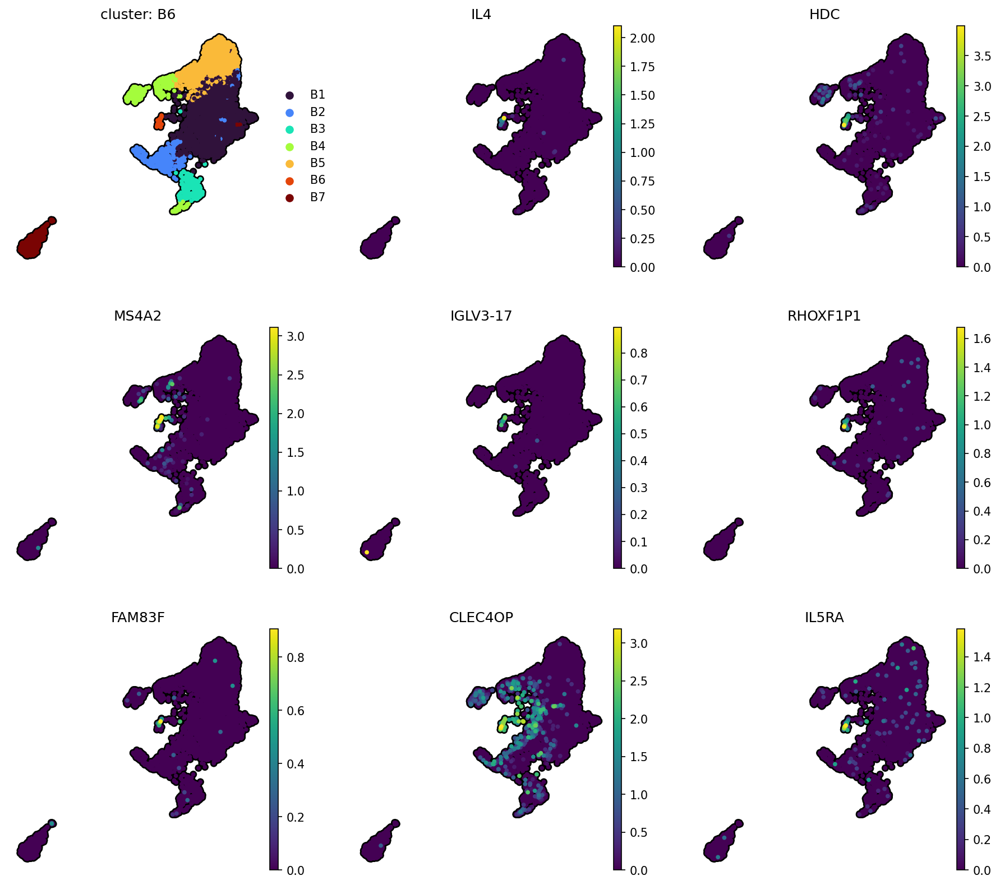

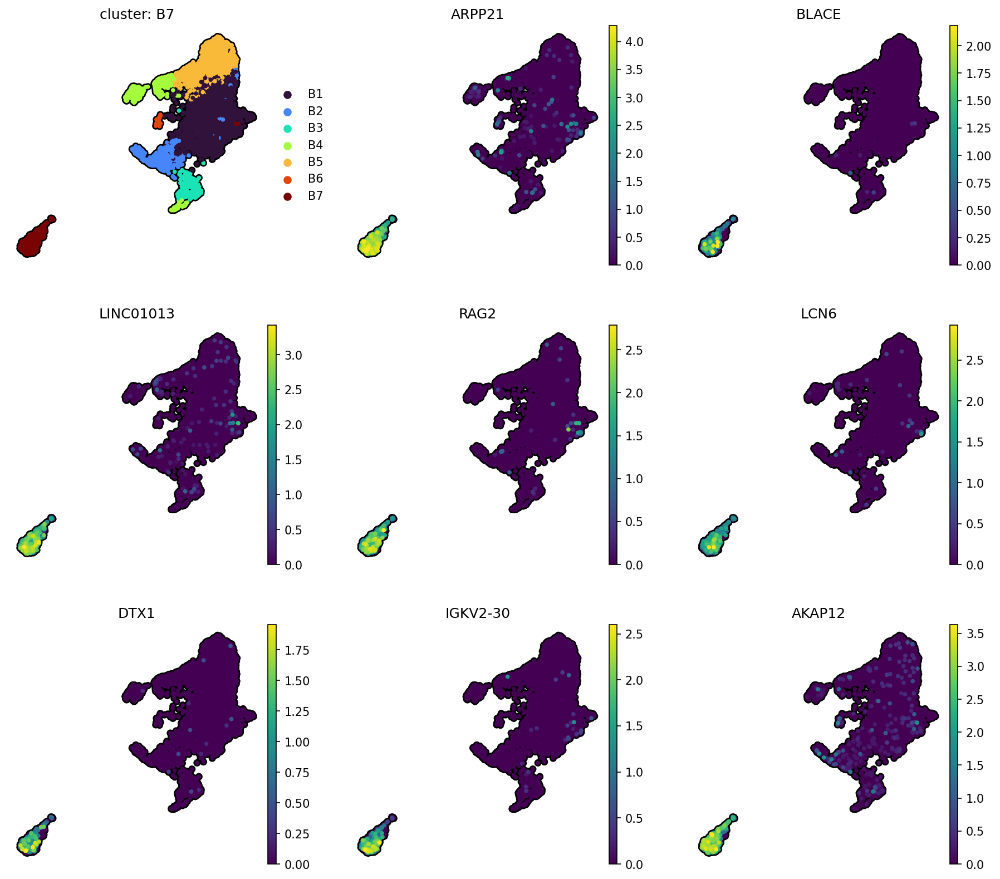

In [18]:
pct_nz_group = 0.25
n_genes = 8

pdf = deg.copy()
pdf = pdf[~pdf['names'].str.startswith('ENSG')].copy()
pdf = pdf[~pdf['names'].str.startswith('MT')].copy()
pdf = pdf[~pdf['names'].str.startswith('RP')].copy()
pdf = pdf[pdf['pct_nz_group'] > pct_nz_group].copy()
print(f"{pdf.shape=}")

gene_list = []

for group_name, group in pdf.groupby('group'):
    group = group.sort_values('logfoldchanges', ascending=False)
    gene_list = ['bm_cluster'] + group['names'].head(n_genes).to_list()

    plt.rcParams['figure.dpi'] = 150
    plt.rcParams['figure.figsize'] = 4, 4
    
    sc.pl.umap(
        adata,
        color=gene_list,
        size=55,
        ncols=3,
        alpha=1,
        use_raw=False,
        add_outline=True,
        title=[f"cluster: {group_name}"] + group['names'].head(n_genes).to_list(),
        outline_color=('k', 'k'),
        frameon=False,
    )

13:55:42 - INFO - Performing Enrichr analysis using database PanglaoDB_Augmented_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        


pdf.shape=(2288, 8)


13:55:42 - INFO - Performing Enrichr analysis using database PanglaoDB_Augmented_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        



 ==================== cluster B1 ====================
          path_name                   genes
  T Cytotoxic Cells    TRBV19,TRBC2,TRBV5-4
     Decidual Cells    TRBV19,TRBC2,TRBV5-4
Gamma Delta T Cells TRBV19,TRBV5-4,TRBV12-3
      T Cells Naive            TRBV19,TRBC2
           Nuocytes            TRBV19,TRBC2
            T Cells            TRBV19,TRBC2


13:55:42 - INFO - Performing Enrichr analysis using database PanglaoDB_Augmented_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        



 ==================== cluster B2 ====================
                                   path_name                                                                    genes
                                 Neutrophils IGSF6,SIRPB2,AZU1,LYZ,RNASE2,MPO,TREM1,LYST,PRTN3,MNDA,CTSG,FCGR1A,ELANE
                                   Basophils            MS4A6A,MS4A3,CLEC5A,F13A1,SIRPB2,MNDA,LYZ,RNASE2,FCGR1A,TREM1
                                   Monocytes                MS4A6A,CSTA,IGSF6,SIRPB2,PRTN3,MNDA,LYZ,FCGR1A,TREM1,LYST
                               Kupffer Cells                     MS4A6A,IGSF6,CLEC5A,SIRPB2,MNDA,LYZ,MPO,TREM1,LILRB4
                        Red Pulp Macrophages                         MS4A6A,IGSF6,CLEC5A,SIRPB2,MNDA,LYZ,TREM1,LILRB4
                        Alveolar Macrophages                         MS4A6A,IGSF6,CLEC5A,SIRPB2,MNDA,LYZ,TREM1,LILRB4
                                 Macrophages                   MS4A6A,IGSF6,CLEC5A,F13A1,MNDA,LYZ,FCGR1A,TREM1,LILRB4
 

13:55:43 - INFO - Performing Enrichr analysis using database PanglaoDB_Augmented_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        



 ==================== cluster B3 ====================
             path_name                                           genes
   Gamma Delta T Cells TOP2A,ASPM,UBE2C,TROAP,NUSAP1,BIRC5,MKI67,AURKB
Pluripotent Stem Cells                           CCNA2,PIF1,CCNF,NDC80


13:55:43 - INFO - Performing Enrichr analysis using database PanglaoDB_Augmented_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        



 ==================== cluster B4 ====================
                                   path_name                                                 genes
Erythroid-like And Erythroid Precursor Cells MYL4,CA1,KEL,PKLR,HBB,RHAG,CSF2RB,HBA1,HBD,GATA1,KLF1
                               Erythroblasts    CDH1,TFR2,ITGA2B,RHAG,CSF2RB,HBD,MFSD2B,GATA1,KLF1
                              Hemangioblasts                MYL4,ITGA2B,RHAG,HBD,MFSD2B,GATA1,KLF1
                                   Platelets                           CD40LG,ITGA2B,CSF2RB,MFSD2B


13:55:43 - INFO - Performing Enrichr analysis using database PanglaoDB_Augmented_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        



 ==================== cluster B5 ====================
               path_name                                    genes
Hematopoietic Stem Cells MYCT1,HLF,MECOM,GATA3,CLEC9A,HOXB5,PTGS1
       Endothelial Cells              CRHBP,CLEC3B,MYCT1,EMCN,CFH


13:55:43 - INFO - Performing Enrichr analysis using database PanglaoDB_Augmented_2021. 
        Please note that there might be a more appropriate database for your application. 
        Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
        



 ==================== cluster B6 ====================
                                   path_name                                           genes
                                   Basophils IL4,MS4A3,ADORA2B,HDC,CSF2RB,ENPP3,MS4A2,RNASE2
                                  Mast Cells IL4,TPSB2,SLC45A3,HDC,CSF2RB,ENPP3,MS4A2,TPSAB1
                               Erythroblasts                 MS4A3,CEBPE,GRAP2,CSF2RB,RNASE2
                                 Eosinophils               ALOX5AP,IL5RA,CSF2RB,RNASE2,IKZF2
                                 Neutrophils                       HDC,ALOX5AP,CSF2RB,RNASE2
Erythroid-like And Erythroid Precursor Cells                       MS4A3,GRAP2,CSF2RB,RNASE2

 ==================== cluster B7 ====================
   path_name                                   genes
     B Cells CD79A,VPREB1,MME,POU2AF1,EBF1,DNTT,PAX5
Plasma Cells             CD79A,IGKV2-24,CD9,IGKV2-30


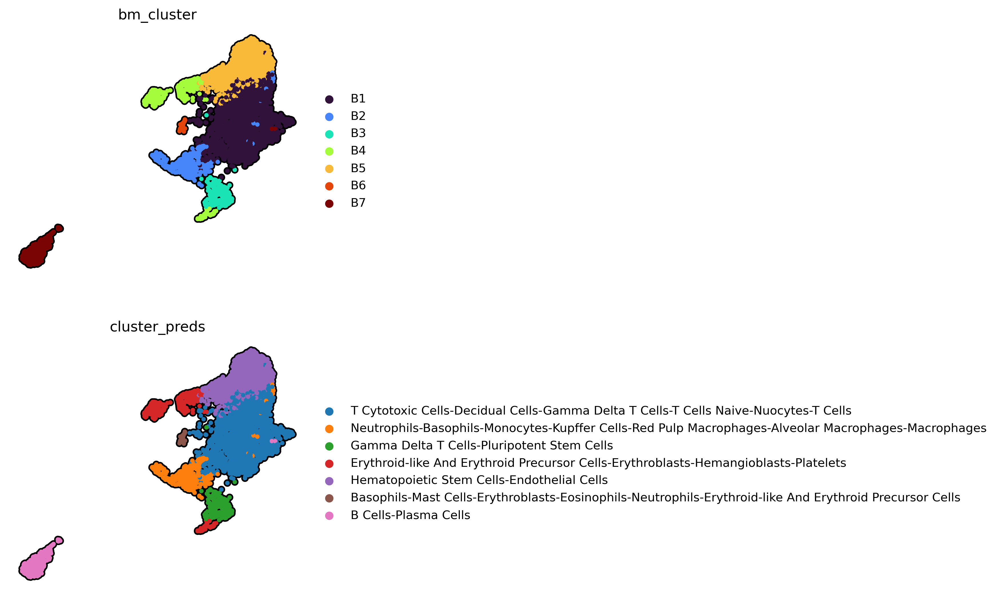

In [19]:
pct_nz_group = 0.15
alpha = 0.05
n_genes = 50
database = "celltypes"

pdf = deg.copy()
pdf = pdf[~pdf['names'].str.startswith('MT')].copy()
pdf = pdf[~pdf['names'].str.startswith('RP')].copy()
pdf = pdf[pdf['pct_nz_group'] > pct_nz_group].copy()
print(f"{pdf.shape=}")

cell_types = {}

for group_name, group in pdf.groupby('group'):
    group = group.sort_values('logfoldchanges', ascending=False)
    gene_list = group['names'].head(n_genes).to_list()

    edf = gget.enrichr(gene_list, database=database)
    edf = edf[edf['adj_p_val'] < alpha]
    edf['genes'] = edf['overlapping_genes'].apply(lambda x: ",".join(x))
    edf = edf[['path_name', 'genes']]
    print('\n', "=" * 20, f"cluster {group_name}" ,"=" * 20)
    print(edf.to_string(index=False))

    cluster_preds = "-".join(edf['path_name'].to_list()[:7])
    cell_types[group_name] = cluster_preds

adata.obs['cluster_preds'] = adata.obs['bm_cluster'].map(cell_types)

# selection variables
genes = ["bm_cluster", "cluster_preds"]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=genes,
    size=55,
    ncols=1,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    outline_color=('k', 'k'),
    frameon=False,
)

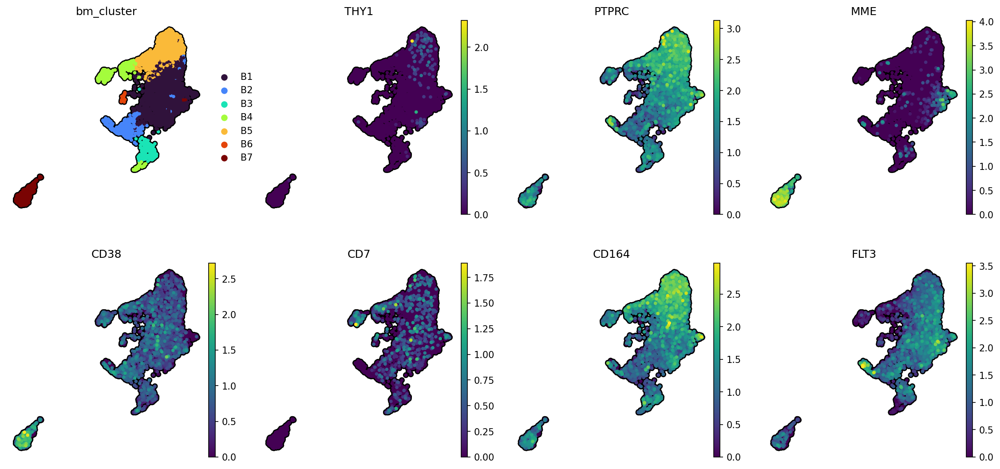

In [20]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 4

gene_list = [
    'bm_cluster', 
    'THY1', # HSC,
    'PTPRC', 
    'MME', # CD10
    'CD38',
    'CD7',
    'CD164',
    'FLT3',  # CD135
]

sc.pl.umap(
    adata,
    color=gene_list,
    size=55,
    ncols=4,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.15,
)

/tmp/ipykernel_3793551/319483373.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs[mean_col] = expr.groupby(cluster_key)[g].transform("mean")
/tmp/ipykernel_3793551/319483373.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs[mean_col] = expr.groupby(cluster_key)[g].transform("mean")
/tmp/ipykernel_3793551/319483373.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs[mean_col] = expr.g

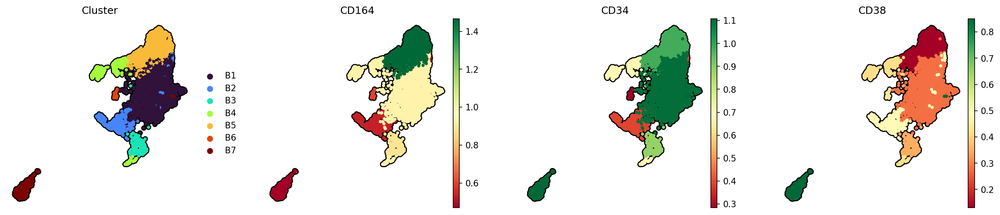

In [21]:
def plot_cluster_mean_genes(
    adata,
    genes,                           # list or tuple of gene names
    cluster_key="bm_cluster",
    size=55,
    cmap="Reds",
    ncols=4,
):
    """
    Plot UMAP colored by cluster ID and by cluster-level mean expression
    for each gene in `genes`.

    Parameters
    ----------
    adata : AnnData
        Object with expression matrix in `.X` and cluster labels in `.obs[cluster_key]`.
    genes : list[str] or tuple[str]
        One or more gene symbols present in `adata.var_names`.
    cluster_key : str, default "bm_cluster"
        Column in `adata.obs` containing cluster labels.
    size : int, default 55
        Point size for UMAP scatter.
    cmap : str, default "Reds"
        Colormap for gene expression panels.
    ncols : int, default 4
        Number of columns in the UMAP figure grid.
    """
    plt.rcParams["figure.dpi"] = 150
    plt.rcParams["figure.figsize"] = (4, 4)

    # Ensure genes is iterable
    if isinstance(genes, str):
        genes = [genes]

    # Build a DataFrame with requested genes
    expr = adata.to_df()[genes].copy()
    expr[cluster_key] = adata.obs[cluster_key].values

    # Compute cluster-level means and write back to .obs
    for g in genes:
        mean_col = f"{g}_mean"
        adata.obs[mean_col] = expr.groupby(cluster_key)[g].transform("mean")

    # Prepare list of variables to color by: cluster ID + all mean columns
    color_vars = [cluster_key] + [f"{g}_mean" for g in genes]

    sc.pl.umap(
        adata,
        color=color_vars,
        size=size,
        alpha=1,
        cmap=cmap,
        use_raw=False,
        add_outline=True,
        outline_color=("k", "k"),
        ncols=ncols,
        title=["Cluster"] + [f"{g}" for g in genes],
        frameon=False,
        wspace=0.25,
    )

plot_cluster_mean_genes(
    adata,
    genes=["CD164", "CD34", "CD38"],
    cluster_key="bm_cluster",
    cmap="RdYlGn",
    ncols=4,
)

/tmp/ipykernel_3793551/319483373.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs[mean_col] = expr.groupby(cluster_key)[g].transform("mean")
/tmp/ipykernel_3793551/319483373.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs[mean_col] = expr.groupby(cluster_key)[g].transform("mean")
/tmp/ipykernel_3793551/319483373.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs[mean_col] = expr.g

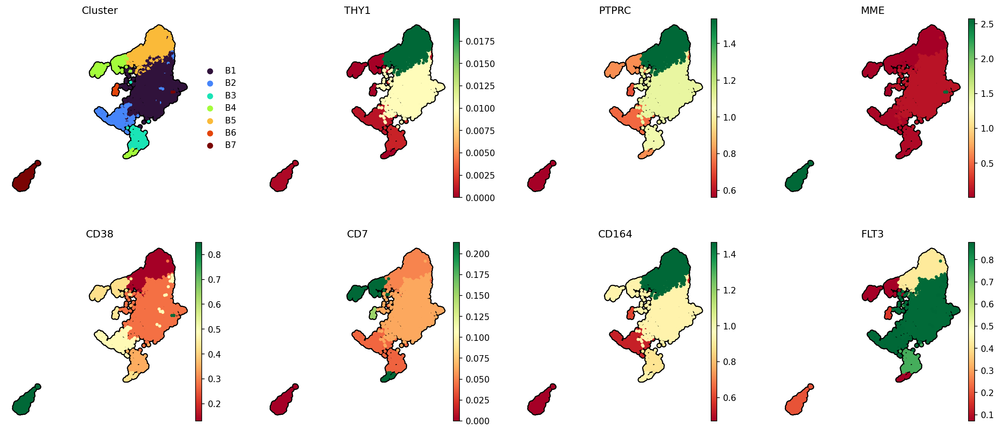

In [22]:
gene_list = [
    'THY1',
    'PTPRC',
    'MME', # CD10
    'CD38',
    'CD7',
    'CD164',
    'FLT3',  # CD135
]

plot_cluster_mean_genes(
    adata,
    genes=gene_list,
    cluster_key="bm_cluster",
    cmap="RdYlGn",
    ncols=4,
)

/tmp/ipykernel_3793551/319483373.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs[mean_col] = expr.groupby(cluster_key)[g].transform("mean")
/tmp/ipykernel_3793551/319483373.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs[mean_col] = expr.groupby(cluster_key)[g].transform("mean")
/tmp/ipykernel_3793551/319483373.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs[mean_col] = expr.g

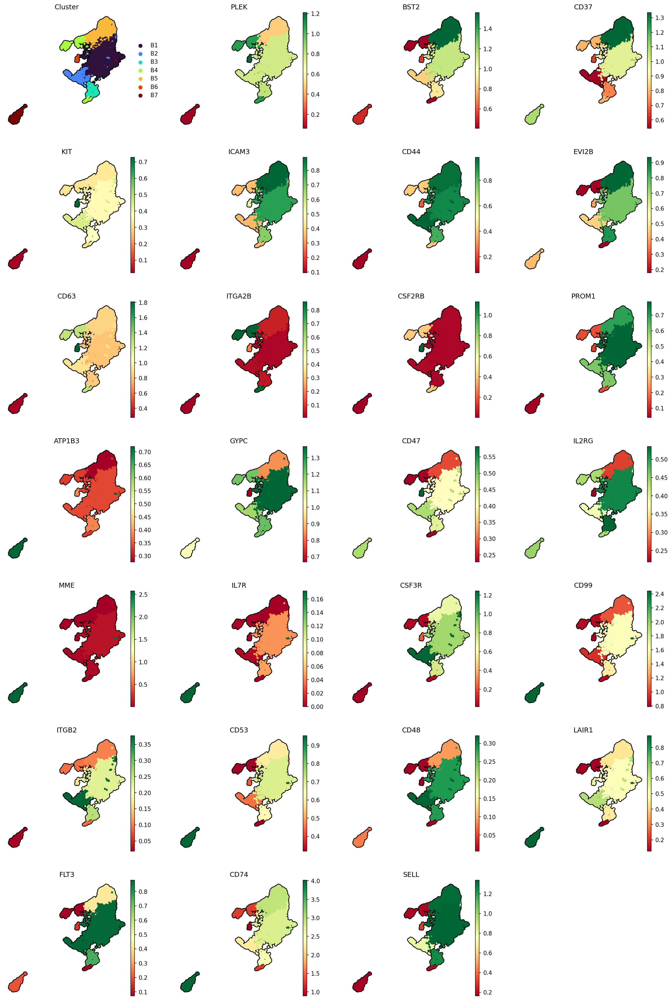

In [23]:
pellin_genes =   [
    "PLEK","BST2", "CD37", "KIT", "ICAM3", "CD44", "EVI2B", # HSC
    "CD63", "ITGA2B", "CSF2RB", "PROM1", "ATP1B3", "GYPC", "CD47", "IL2RG", 
    "MME", "IL7R", "CSF3R", "CD99", "ITGB2", "CD53", "CD48", "LAIR1",
    "FLT3", "CD74", "SELL",
]

plot_cluster_mean_genes(
    adata,
    genes=pellin_genes,
    cluster_key="bm_cluster",
    cmap="RdYlGn",
    ncols=4,
)


In [24]:
df = adata.to_df(layer='raw_counts')

gene_list = [
    'CD34',
    'THY1',
    'PTPRC',
    'MME', # CD10
    'CD38',
    'CD7',
    'CD164',
    'FLT3',  # CD135
]

df = df[gene_list].astype(bool).astype(int)
df['bm_cluster'] = adata.obs['bm_cluster'].copy()

df = df.groupby('bm_cluster').agg(
    lambda x: np.sum(x) / len(x)
)

print(df.round(3).to_string())

             CD34   THY1  PTPRC    MME   CD38    CD7  CD164   FLT3
bm_cluster                                                        
B1          0.931  0.022  0.924  0.112  0.489  0.130  0.888  0.833
B2          0.549  0.002  0.799  0.034  0.706  0.107  0.734  0.836
B3          0.921  0.007  0.977  0.086  0.720  0.125  0.938  0.862
B4          0.795  0.000  0.876  0.020  0.702  0.455  0.914  0.190
B5          0.902  0.036  0.977  0.010  0.212  0.090  0.966  0.541
B6          0.519  0.000  0.865  0.019  0.731  0.327  0.827  0.308
B7          0.794  0.002  0.499  0.976  0.693  0.000  0.479  0.228


/tmp/ipykernel_3793551/1630131111.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby('bm_cluster').agg(


# Cell Assign

In [25]:
# %%time
# fpath = "/scratch/indikar_root/indikar1/shared_data/hematokytos/sample_2_adata_cell_type_deg.parquet"

# mdf = pd.read_parquet(fpath)
# print(f"{mdf.shape=}")
# mdf.head()

In [26]:
# def load_label_map_at_level(file_path: str, level: str) -> dict:
#     with open(file_path, 'r') as f:
#         full_data = yaml.safe_load(f)
#     label_map = {}
#     for label, data in full_data.items():
#         if not isinstance(data, dict):
#             continue
#         value = data.get(level)
#         if value is None:
#             highest_level_key = max([k for k in data if str(k).startswith('level')], default=None)
#             if highest_level_key:
#                 value = data.get(highest_level_key)
#         if value is not None:
#             label_map[label] = value
#     return label_map
    
# fpath = "../../resources/cell_labels.yaml"
# label_map = load_label_map_at_level(fpath, "level3")

# mdf['cell_group'] = mdf['group'].map(label_map)
# mdf = mdf[mdf['cell_group'].notna()]
# print(f"{mdf.shape=}")

# # filters
# logfoldchanges = 1.5
# pvals_adj = 0.05
# pct_nz_group = 0.15

# # Apply the filter and drop rows that do not meet criteria
# marker_mat = mdf.copy()

# marker_mat = marker_mat[
#     (marker_mat['logfoldchanges'] >= logfoldchanges) &
#     (marker_mat['pvals_adj'] <= pvals_adj) &
#     (marker_mat['pct_nz_group'] >= pct_nz_group)
# ].copy()

# print(f"{marker_mat.shape=}")
# marker_mat.head()

In [27]:
# fpath = "../../resources/Tabula_Sapiens.txt"

# data = [x for x in open(fpath) if "Bone" in x]
# records = []

# for line in data:
#     # remove newline, split on tabs, drop empty strings
#     parts = [x for x in line.strip().split('\t') if x]
#     if not parts:
#         continue
#     cell_type = parts[0]
#     cell_type = cell_type.replace("Bone Marrow-", "").lower()
#     genes = parts[1:]
#     for gene in genes:
#         records.append((cell_type, gene))

# # create tidy DataFrame
# marker_mat = pd.DataFrame(records, columns=["cell_type", "gene_name"])
# marker_mat['values'] = 1
# marker_mat = pd.pivot_table(
#     marker_mat,
#     index='gene_name',
#     columns='cell_type',
#     values='values',
#     fill_value=0.0,
# )
# print(f"raw: {marker_mat.shape=}")
# marker_mat = marker_mat[marker_mat.index.isin(adata.var_names)]
# print(f"filtered: {marker_mat.shape=}")
# marker_mat.head()

In [28]:
# # demand that the marker genes are also differentially expressed!
# marker_mat = marker_mat[marker_mat.index.isin(deg['names'].unique())]
# print(f"{marker_mat.shape=}")
# marker_mat.head()

# # demand that the marker genes are also highly variable!
# hvg = adata.var[adata.var['highly_variable']].index
# marker_mat = marker_mat[marker_mat.index.isin(hvg)]
# print(f"{marker_mat.shape=}")
# marker_mat.head()

In [29]:
# %%time

# # operate on a copy
# bdata = adata.copy()
# rsc.get.anndata_to_CPU(bdata)

# # add library size
# lib_size = bdata.to_df(layer='raw_counts').sum(1)
# bdata.obs["size_factor"] = lib_size / np.mean(lib_size)

# # subset genes
# bdata = bdata[:, marker_mat.index].copy()

# torch.cuda.empty_cache() 
# torch.cuda.ipc_collect() 

# scvi.external.CellAssign.setup_anndata(
#     bdata, 
#     size_factor_key="size_factor",
# )

# model = CellAssign(bdata, marker_mat)
# model.train(
#     max_epochs=5000,
#     lr=0.001,
#     train_size=0.65,
#     validation_size=0.25,
#     accelerator='gpu',
#     shuffle_set_split=False,
# )

# model.history["elbo_validation"].plot()

In [30]:
# preds = model.predict()
# print(f"{preds.shape=}")

# confusion_matrix = pd.crosstab(
#     preds.idxmax(axis=1),
#     adata.obs['bm_cluster'].values,
#     rownames=["y Pred"],
#     colnames=["y True"],
# )

# plt.rcParams['figure.dpi'] = 200
# plt.rcParams['figure.figsize'] = 6.75, 6.75
# sns.heatmap(
#     confusion_matrix.T,
#     square=True,
#     cmap="Reds", 
#     cbar_kws={"label": "count", "shrink": 0.4},
#     annot=True,
#     fmt="d",
#     linewidths=0.5,
#     linecolor='k'
# )

# # Aesthetics
# plt.ylabel("Cluster")
# plt.xlabel("Prediction")
# plt.xticks(rotation=90)
# plt.yticks(rotation=0)
# plt.tight_layout()
# plt.show()

# Manually Label

In [31]:
sorted(adata.obs['bm_cluster'].unique())

['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7']

In [32]:
label_map = {
    'B1' : "MPP", 
    'B2' : "LMPP", 
    'B3' : "CMP", 
    'B4' : "MEG/ERY", 
    'B5' : "HSC",
    'B6' : "NA",
    'B7' : "CLP",
}

adata.obs['cell_labels'] = adata.obs['bm_cluster'].map(label_map)
adata.obs['cell_labels'].value_counts()

cell_labels
MPP        2225
HSC        1546
LMPP        523
CLP         505
MEG/ERY     453
CMP         304
NA           52
Name: count, dtype: int64

# Write out

In [33]:
outpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/bone_marrow_processed.h5ad"
adata.write(outpath)
adata

AnnData object with n_obs × n_vars = 5608 × 22954
    obs: 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'leiden', 'bm_cluster', 'CD34_avg', 'CD164_avg', 'PROM1_avg', 'CD48_avg', 'FLT3_avg', 'MPO_avg', 'IRF8_avg', 'CD79A_avg', 'GATA1_avg', 'CD34pos_CD38neg_B0251_HTO_1', 'CD34pos_CD38pos_B0252_HTO_2', 'HTO_pred', 'HTO_pred_label', 'cluster_preds', 'CD164_mean', 'CD34_mean', 'CD38_mean', 'THY1_mean', 'PTPRC_mean', 'MME_mean', 'CD7_mean', 'FLT3_mean', 'PLEK_mean', 'BST2_mean', 'CD37_mean', 'KIT_mean', 'ICAM3_mean', 'CD44_mean', 'EVI2B_mean', 'CD63_mean', 'ITGA2B_mean', 'CSF2RB_mean', 'PROM1_mean', 'ATP1B3_mean',